**Importing all the required libraries**

In [30]:
import pandas as pd
from tqdm import tqdm
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.sparse.linalg import svds  
from sklearn.cluster import KMeans,MiniBatchKMeans,AgglomerativeClustering
from sklearn.metrics.pairwise import cosine_similarity
import math

# Data Preprocessing and Visualization

**Importing Data**

In [2]:
movies = pd.read_csv("ml-25m/movies.csv")
ratings = pd.read_csv("ml-25m/ratings.csv")

In [3]:
genres = set()
for all_genres in movies["genres"]:
    for genre in all_genres.split("|"):
        genres.add(genre)
genres = list(genres)


Creating pandas dataframe where the rows in the data shows 1 if that particular genre is applicabe to that movie and 0 if not, this will help us in associating the movies with other ones based on the genre of the movies.

In [4]:
genres_mapped_data = []
for index,data_packet in movies.iterrows():
    temp = {}
    for key in genres:
        temp[key] = 1 if key in data_packet["genres"].split('|') else 0
    genres_mapped_data.append(temp)
genres_mapped_frames = pd.DataFrame(genres_mapped_data, index=list(movies['movieId']))
genres_mapped_frames.head()

,IMAX,Crime,Sci-Fi,Western,Thriller,Adventure,Musical,Documentary,Fantasy,Horror,Mystery,Action,Animation,Children,Drama,Romance,Comedy,(no genres listed),Film-Noir,War
1,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,1,0,0,0
2,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


Scaling the data

In [5]:
scaled_genres_mapped_frames = StandardScaler().fit_transform(genres_mapped_frames)
pd.DataFrame(data=scaled_genres_mapped_frames, columns=genres_mapped_frames.columns).head()

,IMAX,Crime,Sci-Fi,Western,Thriller,Adventure,Musical,Documentary,Fantasy,Horror,Mystery,Action,Animation,Children,Drama,Romance,Comedy,(no genres listed),Film-Noir,War
0,-0.055979,-0.305198,-0.247205,-0.151411,-0.401183,3.749644,-0.131053,-0.314083,4.675168,-0.325767,-0.221724,-0.365264,4.506889,4.502053,-0.833963,-0.375639,1.643240,-0.297066,-0.075413,-0.175927
1,-0.055979,-0.305198,-0.247205,-0.151411,-0.401183,3.749644,-0.131053,-0.314083,4.675168,-0.325767,-0.221724,-0.365264,-0.221883,4.502053,-0.833963,-0.375639,-0.608554,-0.297066,-0.075413,-0.175927
2,-0.055979,-0.305198,-0.247205,-0.151411,-0.401183,-0.266692,-0.131053,-0.314083,-0.213896,-0.325767,-0.221724,-0.365264,-0.221883,-0.222121,-0.833963,2.662129,1.643240,-0.297066,-0.075413,-0.175927
3,-0.055979,-0.305198,-0.247205,-0.151411,-0.401183,-0.266692,-0.131053,-0.314083,-0.213896,-0.325767,-0.221724,-0.365264,-0.221883,-0.222121,1.199094,2.662129,1.643240,-0.297066,-0.075413,-0.175927
4,-0.055979,-0.305198,-0.247205,-0.151411,-0.401183,-0.266692,-0.131053,-0.314083,-0.213896,-0.325767,-0.221724,-0.365264,-0.221883,-0.222121,-0.833963,-0.375639,1.643240,-0.297066,-0.075413,-0.175927


Applying PCA for converting data into 2D and 3D

In [6]:
pca_2 = PCA(n_components=2)
pca_3 = PCA(n_components=3)
principalComponents_2 = pca_2.fit_transform(scaled_genres_mapped_frames)
principalComponents_3 = pca_3.fit_transform(scaled_genres_mapped_frames)


Visualization in **2D** space

In [7]:
data = pd.DataFrame(data = principalComponents_2,columns=['PC1', 'PC2'])
fig = px.scatter(data, x='PC1', y='PC2',width=800, height=600,template="ggplot2",title="Visualizing in 2D space")
fig.show()

Visualization in **3D** space

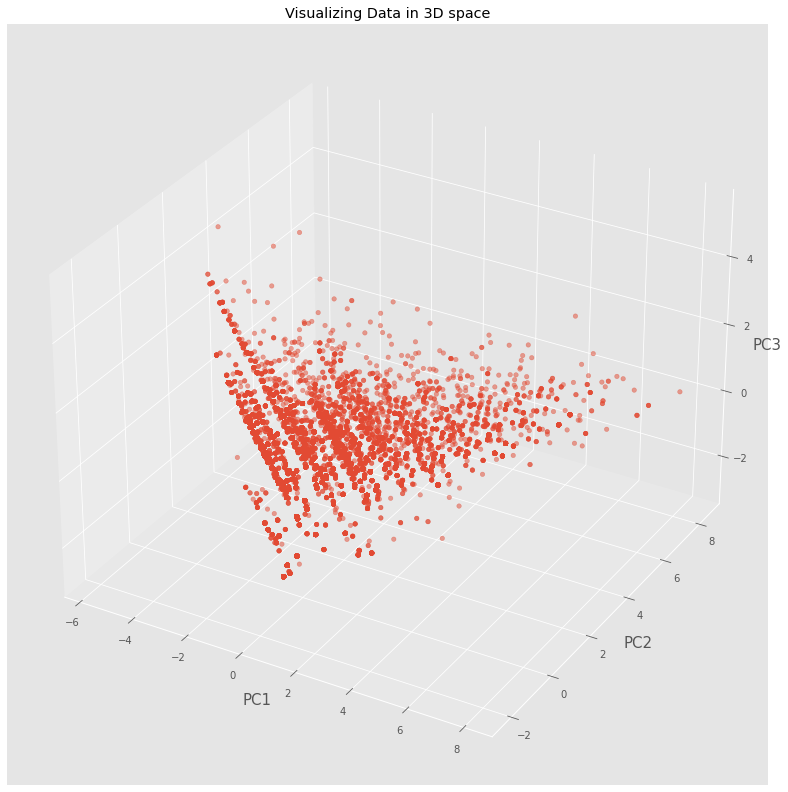

In [8]:
plt.style.use("ggplot")
fig = plt.figure(figsize = (16,14))
ax = fig.add_subplot(projection='3d')
ax.set_title("Visualizing Data in 3D space")
ax.set_xlabel('PC1', fontsize = 15)
ax.set_ylabel('PC2', fontsize = 15)
ax.set_zlabel('PC3', fontsize = 15)

x = [i[0] for i in principalComponents_3]
y = [i[1] for i in principalComponents_3]
z = [i[2] for i in principalComponents_3]

ax.scatter(x, y,z,alpha=0.5)
plt.show()

In [9]:
print("The code for this cell has been commented because it take a lot \nof time for processing this kind of data and hence we are proceeding \nahead with smaller sset of data.")
'''
unique_users = ratings['userId'].unique()
unique_movies = ratings['movieId'].unique()
data = []
for i in range(len(unique_users[:1])):
    temp = {}
    for j in tqdm(range(len(unique_movies)//10)):
        store_val = ratings.loc[(ratings['userId'] == unique_users[i]) & (ratings['movieId'] == unique_movies[j])]['rating']
        if (len(store_val) == 0):
            temp[unique_movies[j]] = 0
        else:
            temp[unique_movies[j]] = float(store_val)
    
    data.append(temp)

ratings_mapped_frames = pd.DataFrame(data, index=list(unique_movies))
'''
      

The code for this cell has been commented because it take a lot 
of time for processing this kind of data and hence we are proceeding 
ahead with smaller sset of data.


"\nunique_users = ratings['userId'].unique()\nunique_movies = ratings['movieId'].unique()\ndata = []\nfor i in range(len(unique_users[:1])):\n    temp = {}\n    for j in tqdm(range(len(unique_movies)//10)):\n        store_val = ratings.loc[(ratings['userId'] == unique_users[i]) & (ratings['movieId'] == unique_movies[j])]['rating']\n        if (len(store_val) == 0):\n            temp[unique_movies[j]] = 0\n        else:\n            temp[unique_movies[j]] = float(store_val)\n    \n    data.append(temp)\n\nratings_mapped_frames = pd.DataFrame(data, index=list(unique_movies))\n"

Importing ml-100k dataset, and creating fataa matrix with **Users** as the rows, ***Movies** as columns and the cell value is the rating given by that particular user to the movie. For the movies where the user hasn't provided any rating we have given the **average** value of the ratings for that particular movie

In [10]:
ratings_data = []
f = open("./ml-100k/u.data","r")
for i in f:
    temp = i.split("\t")
    ratings_data.append(temp)
ratingsDataFrame = pd.DataFrame(ratings_data,columns=["user_id","item_id","rating","timestamp"],dtype=int)
ratingsDataFrame = ratingsDataFrame.drop(["timestamp"],axis=1)

Computing truncated **SVD** as this is one way by which we can reduce dimesionality of the data and visualize in 2D space

In [11]:
uniq_users = ratingsDataFrame["user_id"].unique()
uniq_movies = ratingsDataFrame["item_id"].unique()
table = []
for i in uniq_users:
    packets = ratingsDataFrame[(ratingsDataFrame["user_id"] == i)]
    keys = packets["item_id"]
    vals = packets["rating"]
    table.append(dict(zip(keys,vals.astype(float))))

dataFramesRating = pd.DataFrame(table, index=list(uniq_users))
dataFramesRating = dataFramesRating.fillna(dataFramesRating.mean())

U, sigma, V = svds(dataFramesRating.to_numpy(), k=2)

In [12]:
x1 = [ i[0] for i in U ]
y1 = [ i[1] for i in U ]
u = list(uniq_users)

x2 = [ i for i in V[0] ]
y2 = [ i for i in V[1] ]
v = list(uniq_movies)

plotData1 = pd.DataFrame(np.array([ [x1[i],y1[i],u[i]] for i in range(len(u))]), columns=["x","y","user"])
plotData2 = pd.DataFrame(np.array([ [x2[i],y2[i],v[i]] for i in range(len(v))]), columns=["x","y","items"])

Plotting U describing users

In [13]:
fig = px.scatter(plotData1, x, y,template="ggplot2",title="Plotting U describing users")
fig.show()

Plotting V describing items

In [14]:
fig = px.scatter(plotData2, x, y,template="ggplot2",title="Plotting V describing items")
fig.show()

# Clustering Movies based on their Genres

**Collecting and preprocessing data**

In [15]:
genres = []
f = open("./ml-100k/u.genre","r")
for i in f.readlines():
    temp = i.split("|")
    genres.append(temp[0])
genres.remove("\n")

In [47]:
movies_col = ["movie_id","movie_title","release_date","IMDb_URL"]
movies_col.extend(genres)
moviesData = []
f= open("./ml-100k/u.item","r",encoding="ISO-8859-1")
for i in f:
    temp = i.split("|")
    temp.remove("")
    moviesData.append(temp)
moviesDataFrame = pd.DataFrame(moviesData,columns=movies_col)
movie_id = moviesDataFrame["movie_id"]
moviesDataFrame = moviesDataFrame.drop(columns=["movie_id","movie_title","release_date","IMDb_URL"])
moviesDataFrame["Western"] = moviesDataFrame["Western"].str[:-1]
moviesDataFrame = moviesDataFrame.iloc[:-1 , :]
moviesDataFrame = moviesDataFrame.astype(int)
movies = moviesDataFrame
moviesDataFrame = StandardScaler().fit_transform(moviesDataFrame)


In [124]:
len(genres)

19

First performing K means over the data aand selecting the right K using Elbow method, and based on Elbow method **k=17**

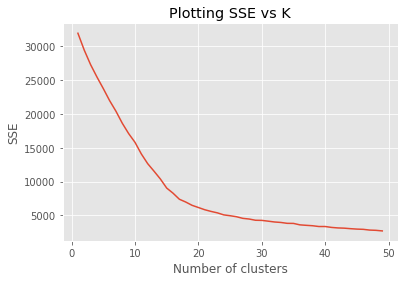

In [123]:
sse=[]
for i in range(1,50):
    kmeans = KMeans(n_clusters=i, max_iter=300, n_init=10, random_state=0)
    kmeans.fit(moviesDataFrame)
    sse.append(kmeans.inertia_)

plt.plot(range(1, 50), sse)
plt.title('Plotting SSE vs K')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()


Creating 3 clustering methods, each with 17 clusters
1. K Means
2. MiniBatchKMeans
3. Agglomerative 

In [18]:
ideal_k = 17
ideal_kmeans = KMeans(n_clusters=ideal_k, max_iter=300, n_init=10, random_state=0).fit(moviesDataFrame)
kmeans_cluster = { i: [] for i in range(ideal_k)}
for i in range(len(ideal_kmeans.labels_)):
    kmeans_cluster[ideal_kmeans.labels_[i]].append(i+1)

In [19]:
mini_batch = MiniBatchKMeans(n_clusters=ideal_k, random_state=0,init="k-means++").fit(moviesDataFrame)
mini_batch_cluster = { i: [] for i in range(ideal_k)}
for i in range(len(ideal_kmeans.labels_)):
    mini_batch_cluster[ideal_kmeans.labels_[i]].append(i+1)

In [20]:
agglo = AgglomerativeClustering(n_clusters=ideal_k).fit(moviesDataFrame)
agglo_cluster = { i: [] for i in range(ideal_k)}
for i in range(len(ideal_kmeans.labels_)):
    agglo_cluster[ideal_kmeans.labels_[i]].append(i+1)

# Item based collaborative filtering w/o Clustering

In [21]:
items_similarity = pd.DataFrame(cosine_similarity(moviesDataFrame))
ratingsDataFrame = ratingsDataFrame.astype('int')
user_mean = {}
for user in ratingsDataFrame["user_id"].unique():
    add = sum(ratingsDataFrame[ratingsDataFrame["user_id"] == user]["rating"])
    lnn = len(ratingsDataFrame[ratingsDataFrame["user_id"] == user]["rating"])
    avg = add/lnn
    user_mean[user] = round(avg,2)

movies_mean = {}
for movie in ratingsDataFrame["item_id"].unique():
    add = sum(ratingsDataFrame[ratingsDataFrame["item_id"] == movie]["rating"])
    lnn = len(ratingsDataFrame[ratingsDataFrame["item_id"] == movie]["rating"])
    avg = add/lnn
    movies_mean[movie] = round(avg,2)

In [22]:
def item_based_filtering(neighbor,user_id,item_id):
    total = 0
    nearest_neighbors = items_similarity.nlargest(neighbor+1,item_id)[item_id]
    #nearest_neighbors = nearest_neighbors.drop(index = item_id)
    denominator = sum(nearest_neighbors)
    for i in nearest_neighbors.index:
        i_mean = movies_mean[i]
        i_sim = nearest_neighbors[i]
        temp = ratingsDataFrame.loc[(ratingsDataFrame['user_id']==user_id) & (ratingsDataFrame['item_id'] == i)]['rating']
        if len(temp) != 0:
            i_rating = int(temp)
        else:
            i_rating = i_mean
        total = total + (i_sim*(i_rating - i_mean))
    
    rating = movies_mean[item_id] + (total / denominator)
    return round(rating,2)

In [121]:
mae = []
rmse = []
key_errors = 0
ratingSample = ratingsDataFrame.sample(frac=0.20)
for item in tqdm(ratingSample.itertuples(), total=ratingSample.shape[0]):
    try:
        predicted_rating = item_based_filtering(5, item[1], item[2])
        actual_rating = item[3]
        mae.append(abs(predicted_rating-actual_rating))
        rmse.append((predicted_rating-actual_rating)**2)
    except:
        key_errors =  key_errors + 1


100%|██████████| 20000/20000 [08:11<00:00, 40.65it/s]

CPU times: user 6min 54s, sys: 39.6 s, total: 7min 33s
Wall time: 8min 11s


In [38]:
mae_value = sum(mae)/len(mae)
rmse_value = math.sqrt(sum(rmse)/len(rmse))
print("Mean of absolute error (MAE) : %.2f" %mae_value)
print("Root of mean squared erroe (RMSE) : %.2f" %rmse_value)

Mean of absolute error (MAE) : 0.72
Root of mean squared erroe (RMSE) : 0.90


# Item based collaborative filtering with Clustering

In [ ]:
def item_based_filtering(neighbor,user_id,item_id):
    total = 0
    nearest_neighbors = items_similarity.nlargest(neighbor+1,item_id)[item_id]
    #nearest_neighbors = nearest_neighbors.drop(index = item_id)
    denominator = sum(nearest_neighbors)
    for i in nearest_neighbors.index:
        i_mean = movies_mean[i]
        i_sim = nearest_neighbors[i]
        temp = ratingsDataFrame.loc[(ratingsDataFrame['user_id']==user_id) & (ratingsDataFrame['item_id'] == i)]['rating']
        if len(temp) != 0:
            i_rating = int(temp)
        else:
            i_rating = i_mean
        total = total + (i_sim*(i_rating - i_mean))
    
    rating = movies_mean[item_id] + (total / denominator)
    return round(rating,2)

In [41]:
def get_clusters(item_id):
    for key in kmeans_cluster.keys(): 
        if item_id in kmeans_cluster[key]:
            kmeans_key = key
            break
    for key in mini_batch_cluster.keys(): 
        if item_id in mini_batch_cluster[key]:
            mini_batch_key = key
            break
    for key in agglo_cluster.keys(): 
        if item_id in agglo_cluster[key]:
            agglo_key = key
            break
    return kmeans_key, mini_batch_key, agglo_key

In [85]:
kmeans_cluster[1].remove(1681)
mini_batch_cluster[1].remove(1681)
agglo_cluster[1].remove(1681)

In [87]:
cluster_type_1 ={}
for key in kmeans_cluster.keys():
    matrix = movies.iloc[kmeans_cluster[key]]
    matrix = StandardScaler().fit_transform(matrix)
    cluster_type_1[key] = matrix

cluster_type_2 ={}
for key in mini_batch_cluster.keys():
    matrix = movies.iloc[mini_batch_cluster[key]]
    matrix = StandardScaler().fit_transform(matrix)
    cluster_type_2[key] = matrix

cluster_type_3 ={}
for key in agglo_cluster.keys():
    matrix = movies.iloc[agglo_cluster[key]]
    matrix = StandardScaler().fit_transform(matrix)
    cluster_type_3[key] = matrix

In [98]:
def get_similarity_matrix(item_id):
    kmeans_key,mini_batch_key,agglo_key = get_clusters(item_id)
    matrix1 = cluster_type_1[kmeans_key]
    matrix2 = cluster_type_2[mini_batch_key]
    matrix3 = cluster_type_3[agglo_key]

    simi_matrix1 = pd.DataFrame(cosine_similarity(matrix1),index=kmeans_cluster[kmeans_key])
    simi_matrix2 = pd.DataFrame(cosine_similarity(matrix2),index=mini_batch_cluster[mini_batch_key] )
    simi_matrix3 = pd.DataFrame(cosine_similarity(matrix3),index=agglo_cluster[agglo_key])
    
    return simi_matrix1,simi_matrix2,simi_matrix3


In [101]:
def item_based_filtering_clustering(neighbor,user_id,item_id):
    simi_matrix1,simi_matrix2,simi_matrix3 = get_similarity_matrix(item_id)

    #Rating for Kmeans
    total = 0
    nearest_neighbors = simi_matrix1.nlargest(neighbor+1,item_id)[item_id]
    denominator = sum(nearest_neighbors)
    for i in nearest_neighbors.index:
        i_mean = movies_mean[i]
        i_sim = nearest_neighbors[i]
        temp = ratingsDataFrame.loc[(ratingsDataFrame['user_id']==user_id) & (ratingsDataFrame['item_id'] == i)]['rating']
        if len(temp) != 0:
            i_rating = int(temp)
        else:
            i_rating = i_mean
        total = total + (i_sim*(i_rating - i_mean))
    
    rating1 = movies_mean[item_id] + (total / denominator)

    #Rating for Kmeans Mini
    total = 0
    nearest_neighbors = simi_matrix1.nlargest(neighbor+1,item_id)[item_id]
    denominator = sum(nearest_neighbors)
    for i in nearest_neighbors.index:
        i_mean = movies_mean[i]
        i_sim = nearest_neighbors[i]
        temp = ratingsDataFrame.loc[(ratingsDataFrame['user_id']==user_id) & (ratingsDataFrame['item_id'] == i)]['rating']
        if len(temp) != 0:
            i_rating = int(temp)
        else:
            i_rating = i_mean
        total = total + (i_sim*(i_rating - i_mean))
    
    rating2 = movies_mean[item_id] + (total / denominator)

    #Rating for Agglo
    total = 0
    nearest_neighbors = simi_matrix1.nlargest(neighbor+1,item_id)[item_id]
    denominator = sum(nearest_neighbors)
    for i in nearest_neighbors.index:
        i_mean = movies_mean[i]
        i_sim = nearest_neighbors[i]
        temp = ratingsDataFrame.loc[(ratingsDataFrame['user_id']==user_id) & (ratingsDataFrame['item_id'] == i)]['rating']
        if len(temp) != 0:
            i_rating = int(temp)
        else:
            i_rating = i_mean
        total = total + (i_sim*(i_rating - i_mean))
    
    rating3 = movies_mean[item_id] + (total / denominator)


    return round(rating1,2),round(rating2,2),round(rating3,2)

In [122]:
key_errors = 0

mae1 = []
rmse1 = []
ratingSample = ratingsDataFrame.sample(frac=0.20)
for item in tqdm(ratingSample.itertuples(), total=ratingSample.shape[0]):
    try:
        predicted_rating = item_based_filtering_clustering(5, item[1], item[2])[0]
        actual_rating = item[3]
        mae1.append(abs(predicted_rating-actual_rating))
        rmse1.append((predicted_rating-actual_rating)**2)
    except:
        key_errors =  key_errors + 1

mae2 = []
rmse2 = []
for item in tqdm(ratingSample.itertuples(), total=ratingSample.shape[0]):
    try:
        predicted_rating = item_based_filtering_clustering(5, item[1], item[2])[1]
        actual_rating = item[3]
        mae2.append(abs(predicted_rating-actual_rating))
        rmse2.append((predicted_rating-actual_rating)**2)
    except:
        key_errors =  key_errors + 1

mae3 = []
rmse3 = []
for item in tqdm(ratingSample.itertuples(), total=ratingSample.shape[0]):
    try:
        predicted_rating = item_based_filtering_clustering(5, item[1], item[2])[2]
        actual_rating = item[3]
        mae3.append(abs(predicted_rating-actual_rating))
        rmse3.append((predicted_rating-actual_rating)**2)
    except:
        key_errors =  key_errors + 1

100%|██████████| 20000/20000 [02:07<00:00, 156.37it/s]

CPU times: user 8min 51s, sys: 58.9 s, total: 9min 50s
Wall time: 5min 46s


In [105]:
mae_value1 = sum(mae1)/len(mae1)
rmse_value1 = math.sqrt(sum(rmse1)/len(rmse1))

mae_value2 = sum(mae2)/len(mae2)
rmse_value2 = math.sqrt(sum(rmse2)/len(rmse2))

mae_value3 = sum(mae3)/len(mae3)
rmse_value3 = math.sqrt(sum(rmse3)/len(rmse3))

print("Using Kmeans Clustering:")
print("Mean of absolute error (MAE) : %.2f" %mae_value1)
print("Root of mean squared erroe (RMSE) : %.2f" %rmse_value1)

print("Using MiniBatchKMeans Clustering:")
print("Mean of absolute error (MAE) : %.2f" %mae_value2)
print("Root of mean squared erroe (RMSE) : %.2f" %rmse_value2)

print("Using Agglomerative Clustering:")
print("Mean of absolute error (MAE) : %.2f" %mae_value3)
print("Root of mean squared erroe (RMSE) : %.2f" %rmse_value3)

Using Kmeans Clustering:
Mean of absolute error (MAE) : 0.77
Root of mean squared erroe (RMSE) : 0.98
Using MiniBatchKMeans Clustering:
Mean of absolute error (MAE) : 0.77
Root of mean squared erroe (RMSE) : 0.98
Using Agglomerative Clustering:
Mean of absolute error (MAE) : 0.77
Root of mean squared erroe (RMSE) : 0.98


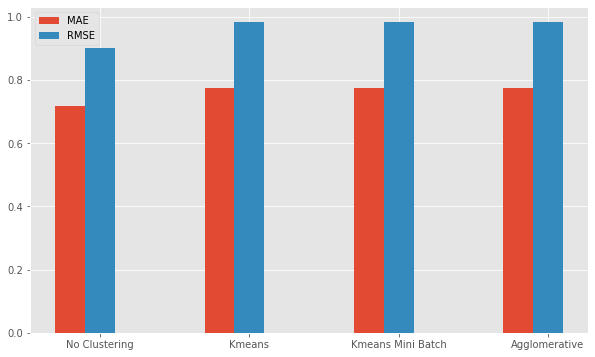

In [120]:
x = np.arange(4)
y1 = [mae_value,mae_value1,mae_value2,mae_value3]
y2 = [rmse_value,rmse_value1,rmse_value2,rmse_value3]
width =0.2
plt.figure(figsize=(10, 6))
plt.bar(x-0.2, y1, width)
plt.bar(x, y2, width)
plt.xticks(x, ["No Clustering", "Kmeans", "Kmeans Mini Batch", "Agglomerative"])
plt.legend(["MAE","RMSE"])
plt.show()